# Pix2Pix GAN
The Pix2Pix is designed to generate an image given a sketch of the image. for example, an image of edges of an object as input and an actual image of the object as output.


we will learn about the architecture to generate the image of a shoe from a hand-drawn doodle (contours) of a shoe. The strategy that we will adopt to generate a realistic image from the doodle is as follows:  

1. Fetch a lot of actual images and create corresponding contours using standard cv2 edge detection techniques.
2. Sample colors from patches of the original image so that the generator knows the colors to generate.
3. Build a UNet architecture that takes the contours with sample patch colors as input and predicts the corresponding image – this is our generator.
4. Build a discriminator architecture that takes an image and predicts whether it is real or fake.
5. Train the generator and discriminator together to a point where the generator can generate images that fool the discriminator.

In [1]:
import os
if not os.path.exists('ShoeV2_photo'):
    !wget https://www.dropbox.com/s/g6b6gtvmdu0h77x/ShoeV2_photo.zip
    !unzip -q ShoeV2_photo.zip


In [2]:
# !pip install -U torch_snippets
from torch_snippets import *
device = 'cuda' if torch.cuda.is_available() else 'cpu'

### Define the dataset class (ShoesData).  
This dataset class returns the original image and the image with edges. One additional detail we will pass to the network is the patches of color that are present in randomly chosen regions. This way, we are enabling the user to take a hand-drawn contour image, sprinkle the required colors at different parts of the image, and generate a new image. A sample input (the third image) and output (the first image) are shown here (best viewed in color):  
![img1](Ch13_pix2pix.png)

the input image we have in step 1 is just of the shoe (the first image) – which we will use to extract the edges of the shoe (the second image). Further, we will sprinkle color in the next step to fetch the preceding image's input (the third image) – output (the first image) combination.  



In [3]:
# Define a function to fetch edges from the downloaded images:
def detect_edges(img):
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    img_gray = cv2.bilateralFilter(img_gray, 5, 50, 50)
    img_gray_edges = cv2.Canny(img_gray, 45, 100)
    img_gray_edges = cv2.bitwise_not(img_gray_edges) # invert black/white
    img_edges = cv2.cvtColor(img_gray_edges, cv2.COLOR_GRAY2RGB)
    return img_edges

IMAGE_SIZE = 256

# image transformation pipeline
preprocess = T.Compose([
    T.Lambda(lambda x: torch.Tensor(x.copy()).permute(2, 0, 1).to(device))
])

normalize = lambda x: (x - 127.5)/127.5


In the following code, we will build the class that takes the contour images, sprinkles colors, and returns the pair of color-sprinkled images and the original shoe image (the image that generated contours):

In [4]:

class ShoesData(Dataset):
    def __init__(self, items):
        self.items = items
    def __len__(self): return len(self.items)
    def __getitem__(self, ix):
        f = self.items[ix]
        try: im = read(f, 1)
        except:
            blank = preprocess(Blank(IMAGE_SIZE, IMAGE_SIZE, 3))
            return blank, blank
        edges = detect_edges(im)
        im, edges = resize(im, IMAGE_SIZE), resize(edges, IMAGE_SIZE)
        im, edges = normalize(im), normalize(edges)
        self._draw_color_circles_on_src_img(edges, im)
        im, edges = preprocess(im), preprocess(edges)
        return edges, im

    def _draw_color_circles_on_src_img(self, img_src, img_target):
        non_white_coords = self._get_non_white_coordinates(img_target)
        for center_y, center_x in non_white_coords:
            self._draw_color_circle_on_src_img(img_src, img_target, center_y, center_x)

    def _get_non_white_coordinates(self, img):
        non_white_mask = np.sum(img, axis=-1) < 2.75
        non_white_y, non_white_x = np.nonzero(non_white_mask)
        # randomly sample non-white coordinates
        n_non_white = len(non_white_y)
        n_color_points = min(n_non_white, 300)
        idxs = np.random.choice(n_non_white, n_color_points, replace=False)
        non_white_coords = list(zip(non_white_y[idxs], non_white_x[idxs]))
        return non_white_coords

    def _draw_color_circle_on_src_img(self, img_src, img_target, center_y, center_x):
        assert img_src.shape == img_target.shape, "Image source and target must have same shape."
        y0, y1, x0, x1 = self._get_color_point_bbox_coords(center_y, center_x)
        color = np.mean(img_target[y0:y1, x0:x1], axis=(0, 1))
        img_src[y0:y1, x0:x1] = color

    def _get_color_point_bbox_coords(self, center_y, center_x):
        radius = 2
        y0 = max(0, center_y-radius+1)
        y1 = min(IMAGE_SIZE, center_y+radius)
        x0 = max(0, center_x-radius+1)
        x1 = min(IMAGE_SIZE, center_x+radius)
        return y0, y1, x0, x1

    def choose(self): return self[randint(len(self))]

In [5]:
from sklearn.model_selection import train_test_split
train_items, val_items = train_test_split(Glob('ShoeV2_photo/*.png'), test_size=0.2, random_state=2)
trn_ds, val_ds = ShoesData(train_items), ShoesData(val_items)

trn_dl = DataLoader(trn_ds, batch_size=32, shuffle=True)
val_dl = DataLoader(val_ds, batch_size=32, shuffle=True)

inspect(*next(iter(trn_dl)))

Tensor	Shape: torch.Size([32, 3, 256, 256])	Min: -1.000	Max: 1.000	Mean: 0.876	dtype: torch.float32
Tensor	Shape: torch.Size([32, 3, 256, 256])	Min: -1.000	Max: 1.000	Mean: 0.546	dtype: torch.float32


In [6]:
def weights_init_normal(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm2d") != -1:
        torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
        torch.nn.init.constant_(m.bias.data, 0.0)

class UNetDown(nn.Module):
    def __init__(self, in_size, out_size, normalize=True, dropout=0.0):
        super(UNetDown, self).__init__()
        layers = [nn.Conv2d(in_size, out_size, 4, 2, 1, bias=False)]
        if normalize:
            layers.append(nn.InstanceNorm2d(out_size))
        layers.append(nn.LeakyReLU(0.2))
        if dropout:
            layers.append(nn.Dropout(dropout))
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)

class UNetUp(nn.Module):
    def __init__(self, in_size, out_size, dropout=0.0):
        super(UNetUp, self).__init__()
        layers = [
            nn.ConvTranspose2d(in_size, out_size, 4, 2, 1, bias=False),
            nn.InstanceNorm2d(out_size),
            nn.ReLU(inplace=True),
        ]
        if dropout:
            layers.append(nn.Dropout(dropout))

        self.model = nn.Sequential(*layers)

    def forward(self, x, skip_input):
        x = self.model(x)
        x = torch.cat((x, skip_input), 1)

        return x

class GeneratorUNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=3):
        super(GeneratorUNet, self).__init__()

        self.down1 = UNetDown(in_channels, 64, normalize=False)
        self.down2 = UNetDown(64, 128)
        self.down3 = UNetDown(128, 256)
        self.down4 = UNetDown(256, 512, dropout=0.5)
        self.down5 = UNetDown(512, 512, dropout=0.5)
        self.down6 = UNetDown(512, 512, dropout=0.5)
        self.down7 = UNetDown(512, 512, dropout=0.5)
        self.down8 = UNetDown(512, 512, normalize=False, dropout=0.5)

        self.up1 = UNetUp(512, 512, dropout=0.5)
        self.up2 = UNetUp(1024, 512, dropout=0.5)
        self.up3 = UNetUp(1024, 512, dropout=0.5)
        self.up4 = UNetUp(1024, 512, dropout=0.5)
        self.up5 = UNetUp(1024, 256)
        self.up6 = UNetUp(512, 128)
        self.up7 = UNetUp(256, 64)

        self.final = nn.Sequential(
            nn.Upsample(scale_factor=2),
            nn.ZeroPad2d((1, 0, 1, 0)),
            nn.Conv2d(128, out_channels, 4, padding=1),
            nn.Tanh(),
        )

    def forward(self, x):
        d1 = self.down1(x)
        d2 = self.down2(d1)
        d3 = self.down3(d2)
        d4 = self.down4(d3)
        d5 = self.down5(d4)
        d6 = self.down6(d5)
        d7 = self.down7(d6)
        d8 = self.down8(d7)
        u1 = self.up1(d8, d7)
        u2 = self.up2(u1, d6)
        u3 = self.up3(u2, d5)
        u4 = self.up4(u3, d4)
        u5 = self.up5(u4, d3)
        u6 = self.up6(u5, d2)
        u7 = self.up7(u6, d1)
        return self.final(u7)

class Discriminator(nn.Module):
    def __init__(self, in_channels=3):
        super(Discriminator, self).__init__()

        def discriminator_block(in_filters, out_filters, normalization=True):
            """Returns downsampling layers of each discriminator block"""
            layers = [nn.Conv2d(in_filters, out_filters, 4, stride=2, padding=1)]
            if normalization:
                layers.append(nn.InstanceNorm2d(out_filters))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers

        self.model = nn.Sequential(
            *discriminator_block(in_channels * 2, 64, normalization=False),
            *discriminator_block(64, 128),
            *discriminator_block(128, 256),
            *discriminator_block(256, 512),
            nn.ZeroPad2d((1, 0, 1, 0)),
            nn.Conv2d(512, 1, 4, padding=1, bias=False)
        )

    def forward(self, img_A, img_B):
        img_input = torch.cat((img_A, img_B), 1)
        return self.model(img_input)

In [7]:
# !pip install torch_summary
from torchsummary import summary
generator = GeneratorUNet().to(device)
discriminator = Discriminator().to(device)

In [8]:
print(summary(generator, torch.zeros(3, 3, IMAGE_SIZE, IMAGE_SIZE).to(device)))

print(summary(discriminator, torch.zeros(3, 3, IMAGE_SIZE, IMAGE_SIZE).to(device), torch.zeros(3, 3,IMAGE_SIZE, IMAGE_SIZE).to(device)))

Layer (type:depth-idx)                   Output Shape              Param #
├─UNetDown: 1-1                          [-1, 64, 128, 128]        --
|    └─Sequential: 2-1                   [-1, 64, 128, 128]        --
|    |    └─Conv2d: 3-1                  [-1, 64, 128, 128]        3,072
|    |    └─LeakyReLU: 3-2               [-1, 64, 128, 128]        --
├─UNetDown: 1-2                          [-1, 128, 64, 64]         --
|    └─Sequential: 2-2                   [-1, 128, 64, 64]         --
|    |    └─Conv2d: 3-3                  [-1, 128, 64, 64]         131,072
|    |    └─InstanceNorm2d: 3-4          [-1, 128, 64, 64]         --
|    |    └─LeakyReLU: 3-5               [-1, 128, 64, 64]         --
├─UNetDown: 1-3                          [-1, 256, 32, 32]         --
|    └─Sequential: 2-3                   [-1, 256, 32, 32]         --
|    |    └─Conv2d: 3-6                  [-1, 256, 32, 32]         524,288
|    |    └─InstanceNorm2d: 3-7          [-1, 256, 32, 32]         --
| 

In [10]:
def discriminator_train_step(real_src, real_trg, fake_trg):
    #discriminator.train()
    d_optimizer.zero_grad()

    prediction_real = discriminator(real_trg, real_src)
    error_real = criterion_GAN(prediction_real, torch.ones(len(real_src), 1, 16, 16).cuda())
    error_real.backward()

    prediction_fake = discriminator(fake_trg.detach(), real_src)
    error_fake = criterion_GAN(prediction_fake, torch.zeros(len(real_src), 1, 16, 16).cuda())
    error_fake.backward()

    d_optimizer.step()

    return error_real + error_fake

def generator_train_step(real_src, fake_trg):
    #discriminator.train()
    g_optimizer.zero_grad()
    prediction = discriminator(fake_trg, real_src)

    loss_GAN = criterion_GAN(prediction, torch.ones(len(real_src), 1, 16, 16).cuda())
    loss_pixel = criterion_pixelwise(fake_trg, real_trg)
    loss_G = loss_GAN + lambda_pixel * loss_pixel

    loss_G.backward()
    g_optimizer.step()
    return loss_G

denorm = T.Normalize((-1, -1, -1), (2, 2, 2))
def sample_prediction():
    """Saves a generated sample from the validation set"""
    data = next(iter(val_dl))
    real_src, real_trg = data
    fake_trg = generator(real_src)
    img_sample = torch.cat([denorm(real_src[0]), denorm(fake_trg[0]), denorm(real_trg[0])], -1)
    img_sample = img_sample.detach().cpu().permute(1,2,0).numpy()
    show(img_sample, title='Source::Generated::GroundTruth', sz=12)

EPOCH: 1.000	errD: 1.194	errG: 20.301	(131.06s - 12975.14s remaining)


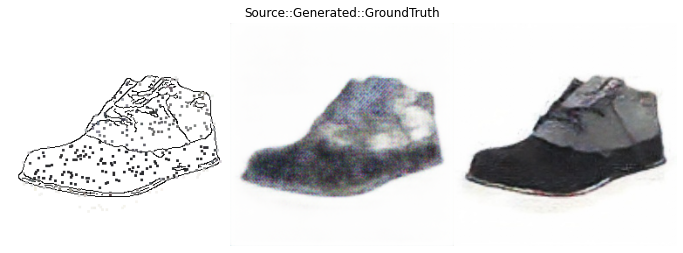

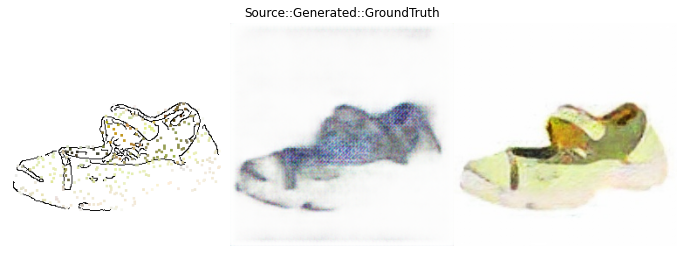

EPOCH: 2.000	errD: 0.541	errG: 10.517	(265.65s - 13016.80s remaining)


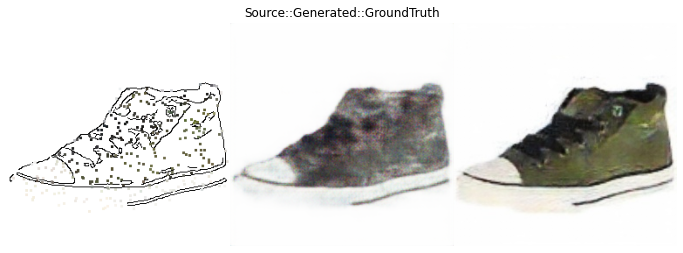

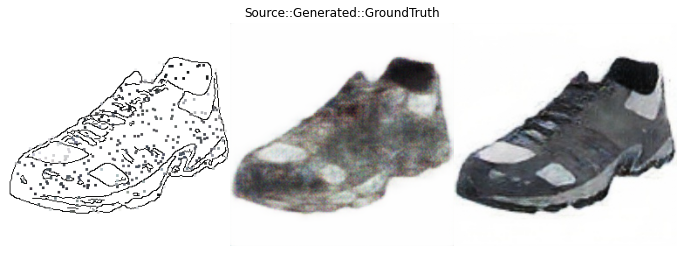

EPOCH: 3.000	errD: 0.535	errG: 8.396	(400.63s - 12953.82s remaining))


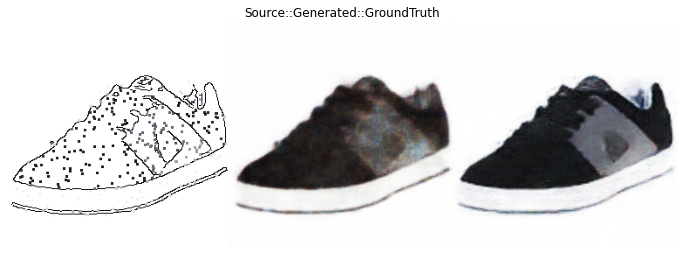

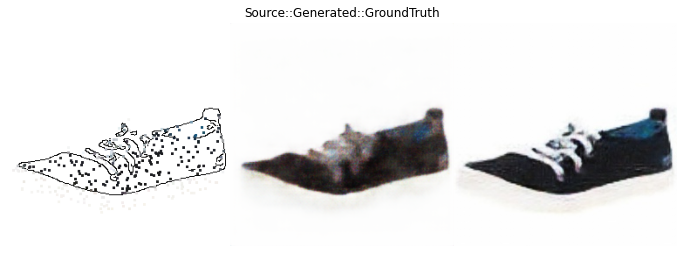

EPOCH: 4.000	errD: 0.532	errG: 7.422	(536.20s - 12868.91s remaining))


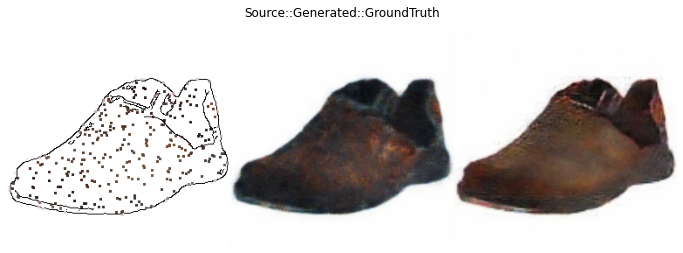

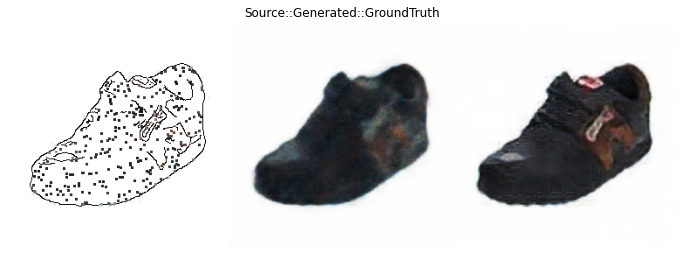

EPOCH: 5.000	errD: 0.530	errG: 6.735	(671.57s - 12759.74s remaining)


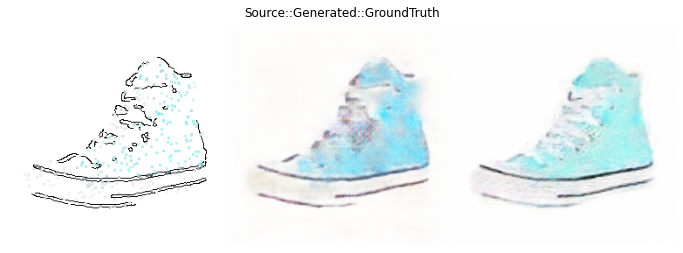

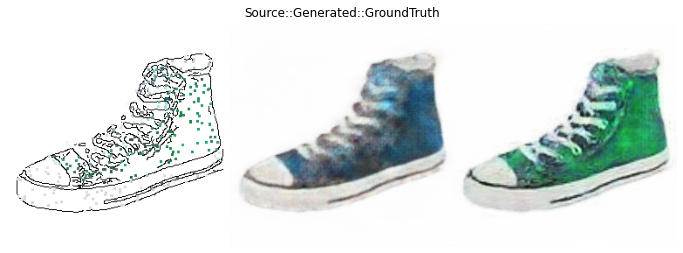

EPOCH: 6.000	errD: 0.518	errG: 6.276	(807.50s - 12650.79s remaining)


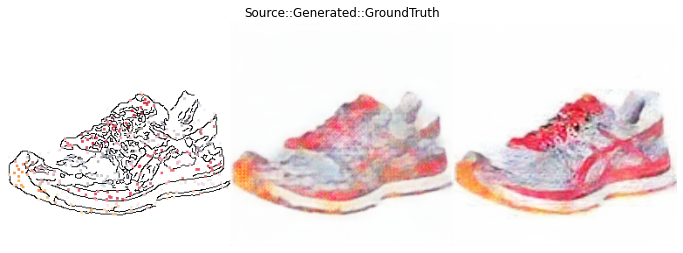

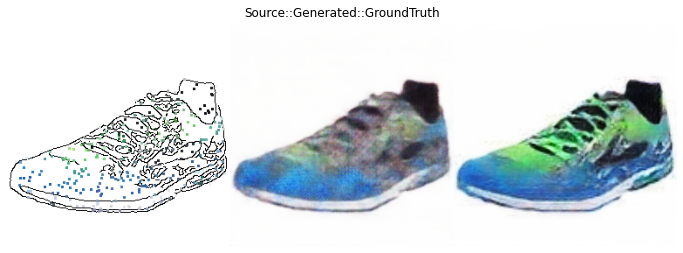

EPOCH: 7.000	errD: 0.498	errG: 5.929	(943.68s - 12537.42s remaining)


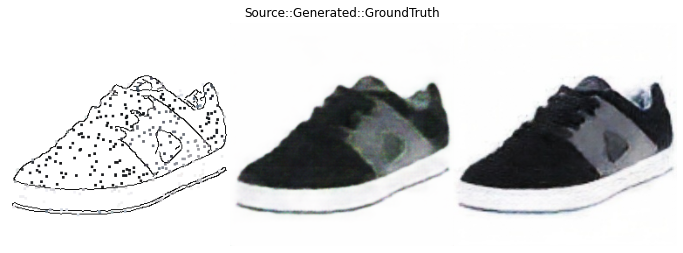

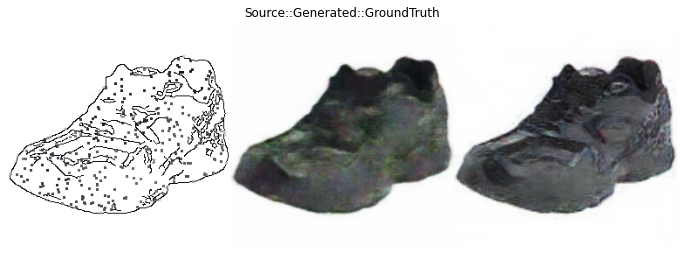

EPOCH: 8.000	errD: 0.505	errG: 5.543	(1079.30s - 12411.90s remaining)


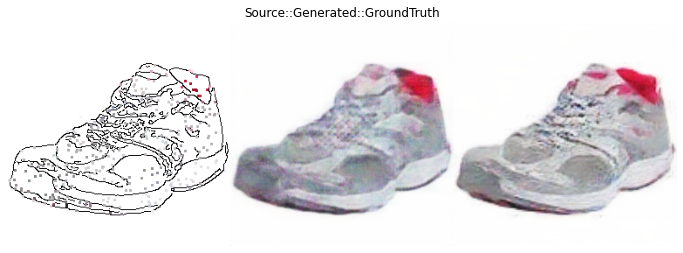

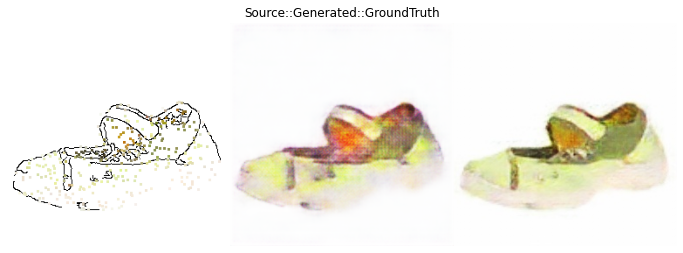

EPOCH: 9.000	errD: 0.499	errG: 5.404	(1214.92s - 12284.21s remaining)


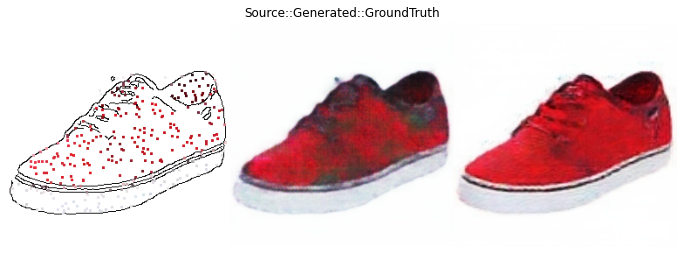

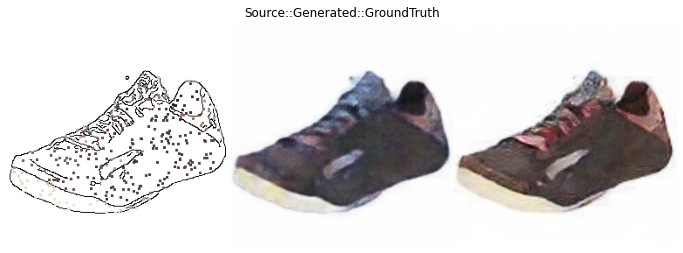

EPOCH: 10.000	errD: 0.509	errG: 5.173	(1350.69s - 12156.23s remaining)


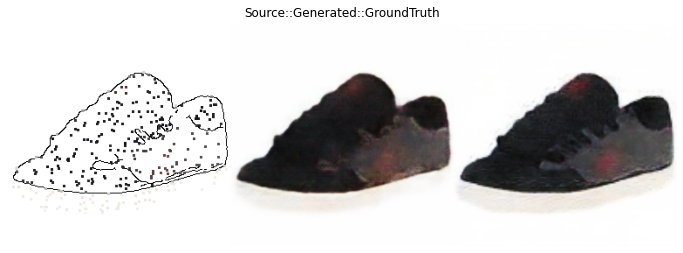

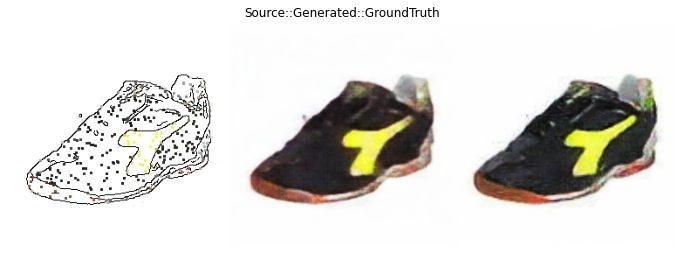

EPOCH: 11.000	errD: 0.480	errG: 4.986	(1486.40s - 12026.32s remaining)


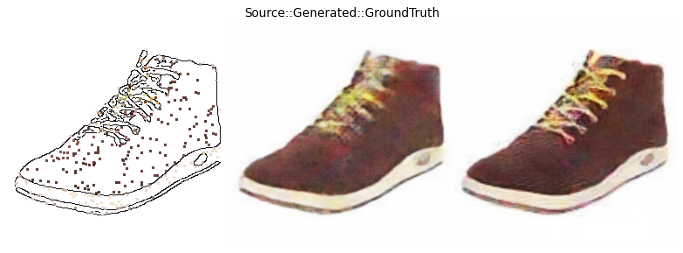

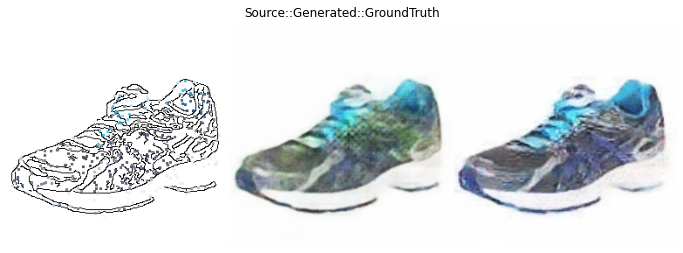

EPOCH: 12.000	errD: 0.478	errG: 4.824	(1622.51s - 11898.41s remaining)


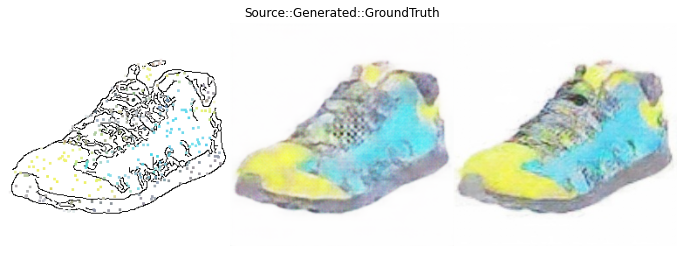

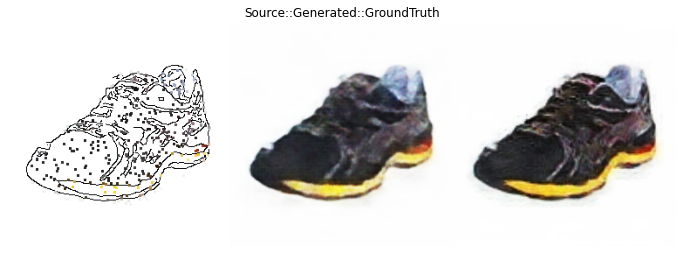

EPOCH: 13.000	errD: 0.477	errG: 4.715	(1758.53s - 11768.62s remaining)


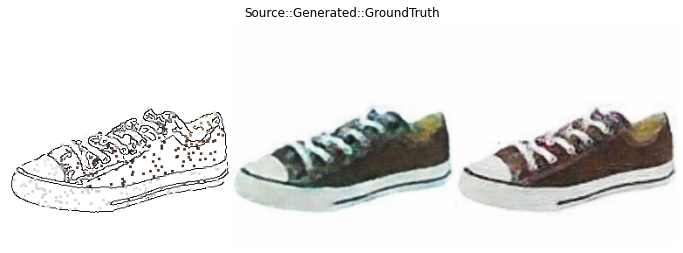

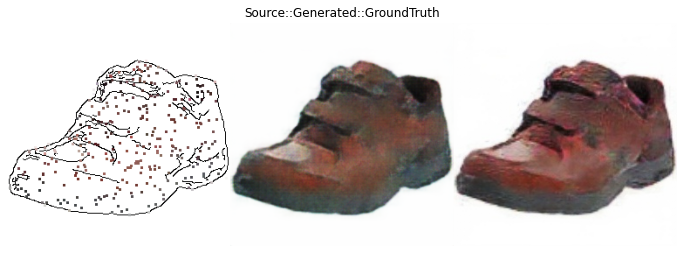

EPOCH: 14.000	errD: 0.486	errG: 4.594	(1894.33s - 11636.60s remaining)


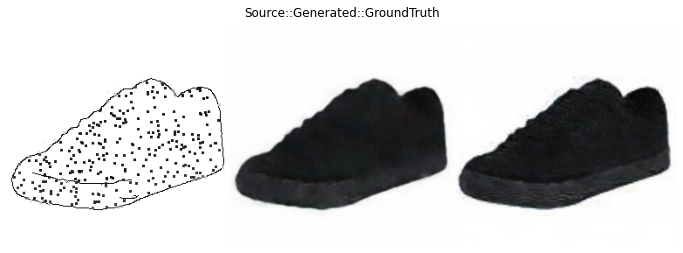

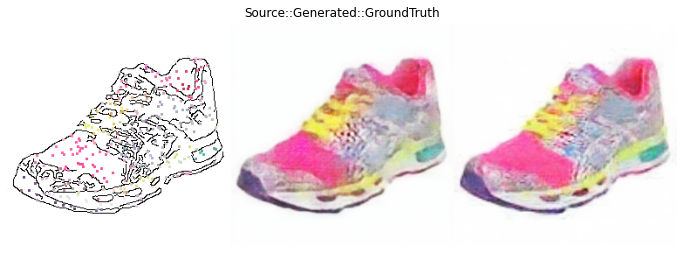

EPOCH: 15.000	errD: 0.482	errG: 4.487	(2030.75s - 11507.57s remaining)


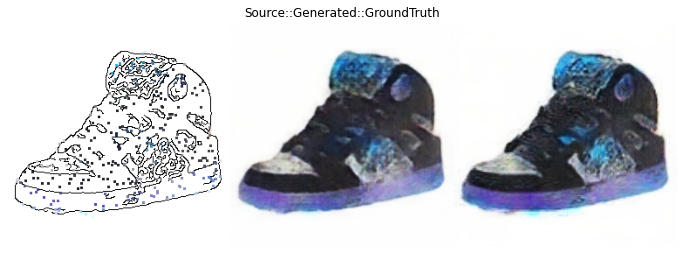

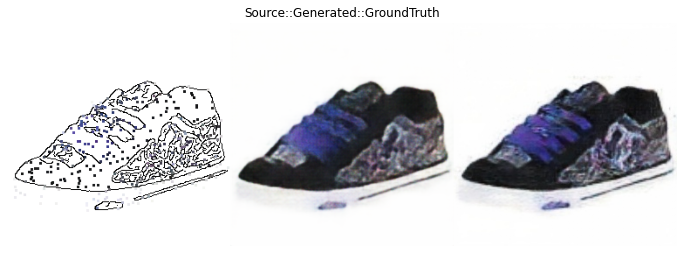

EPOCH: 16.000	errD: 0.494	errG: 4.388	(2166.99s - 11376.69s remaining)


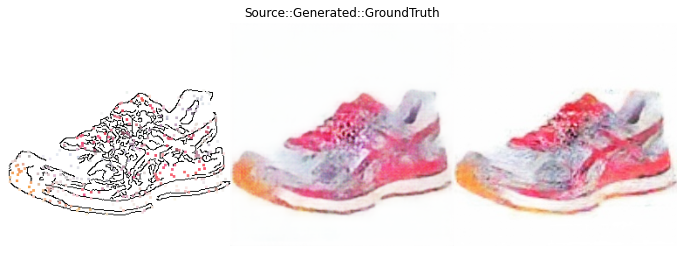

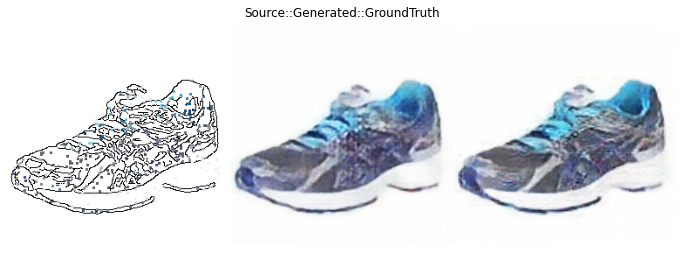

EPOCH: 17.000	errD: 0.509	errG: 4.246	(2303.03s - 11244.21s remaining)


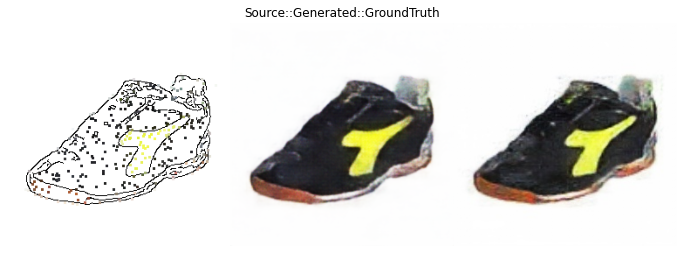

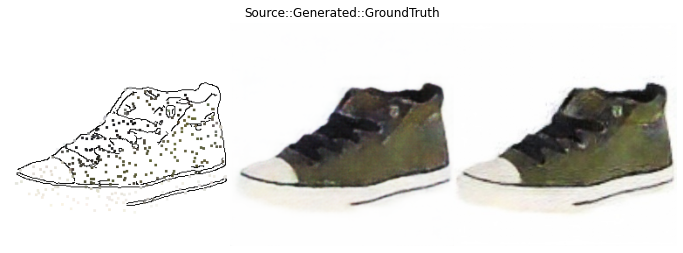

EPOCH: 18.000	errD: 0.492	errG: 4.231	(2438.64s - 11109.37s remaining)


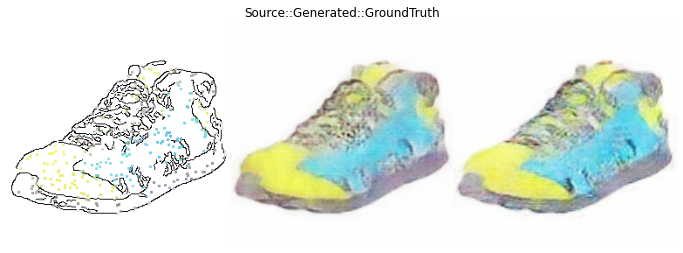

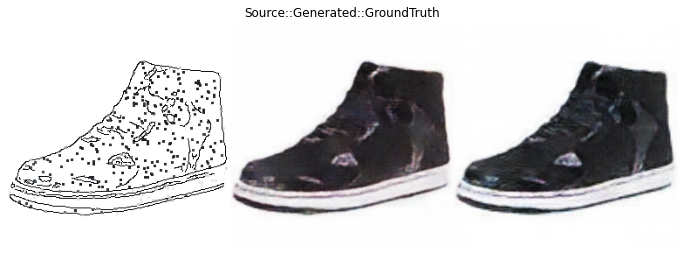

EPOCH: 19.000	errD: 0.511	errG: 4.106	(2574.40s - 10975.09s remaining)


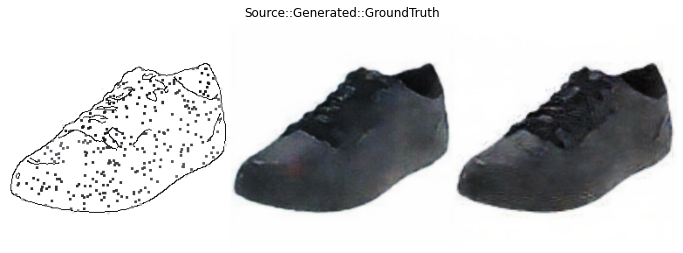

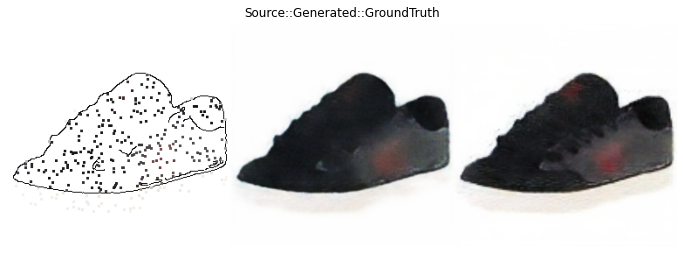

EPOCH: 20.000	errD: 0.515	errG: 4.046	(2710.36s - 10841.43s remaining)


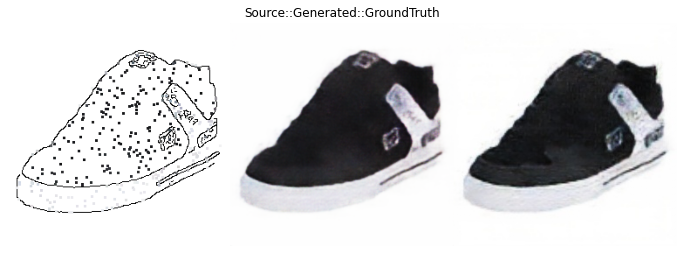

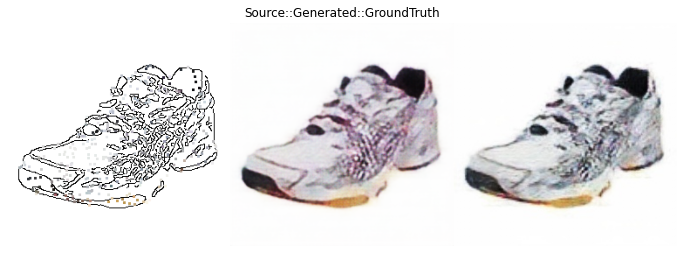

EPOCH: 21.000	errD: 0.512	errG: 3.958	(2846.47s - 10708.14s remaining)


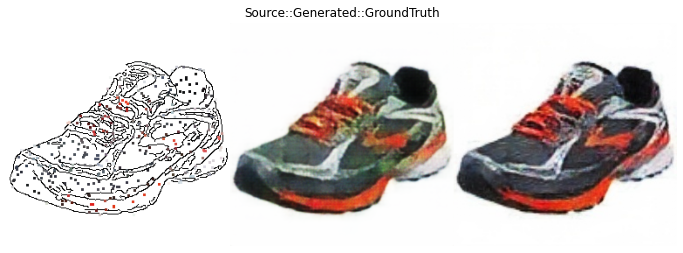

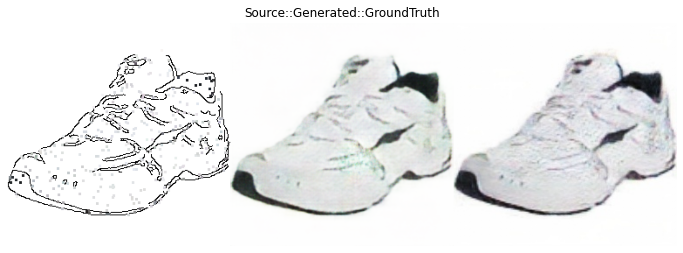

EPOCH: 22.000	errD: 0.508	errG: 3.970	(2982.29s - 10573.57s remaining)


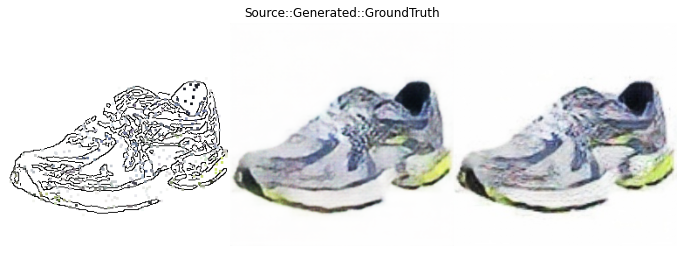

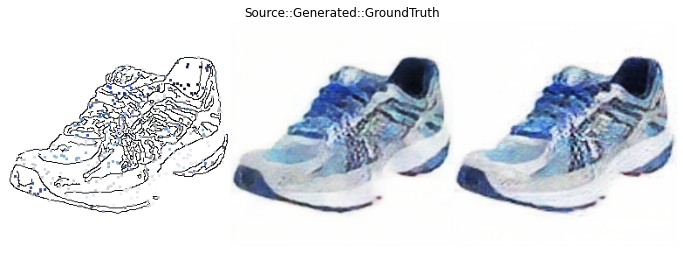

EPOCH: 23.000	errD: 0.513	errG: 3.886	(3118.58s - 10440.45s remaining)


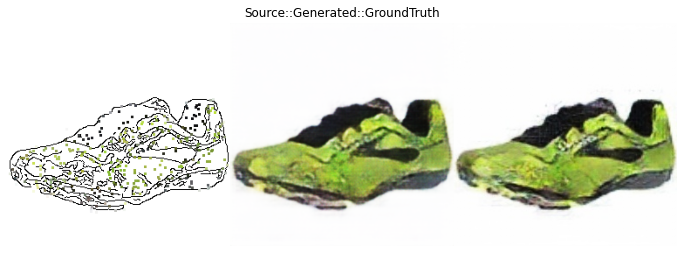

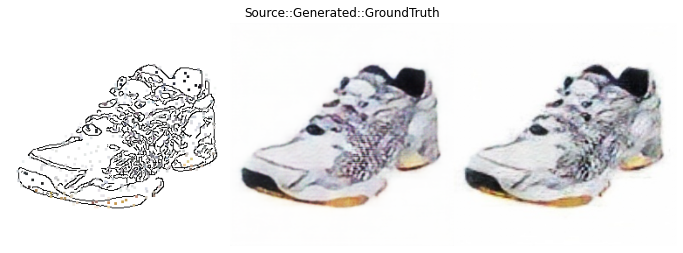

EPOCH: 24.000	errD: 0.505	errG: 3.901	(3254.50s - 10305.92s remaining)


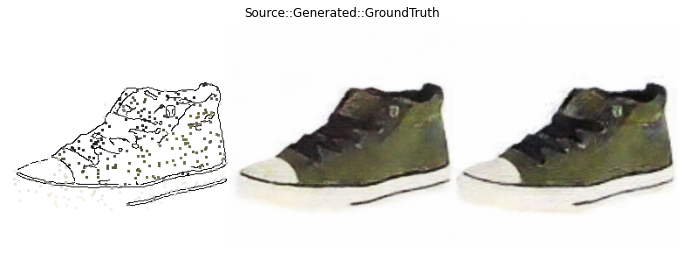

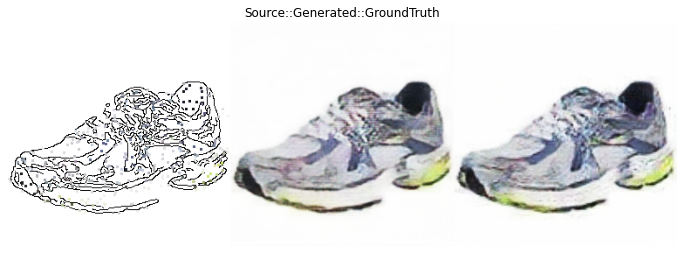

EPOCH: 25.000	errD: 0.499	errG: 3.847	(3390.45s - 10171.35s remaining)


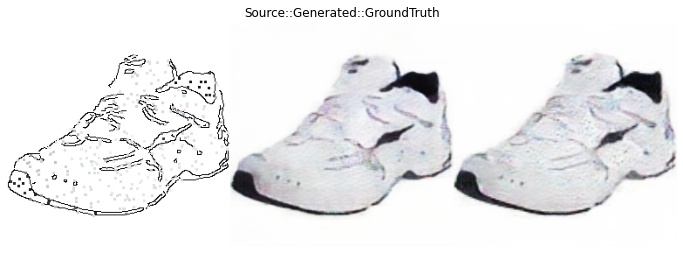

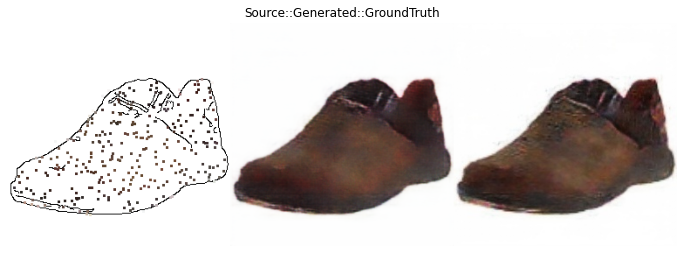

EPOCH: 26.000	errD: 0.521	errG: 3.835	(3526.79s - 10037.78s remaining)


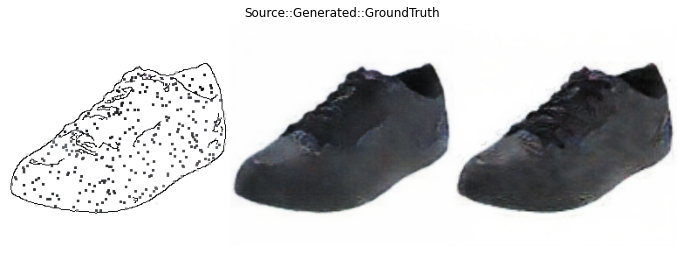

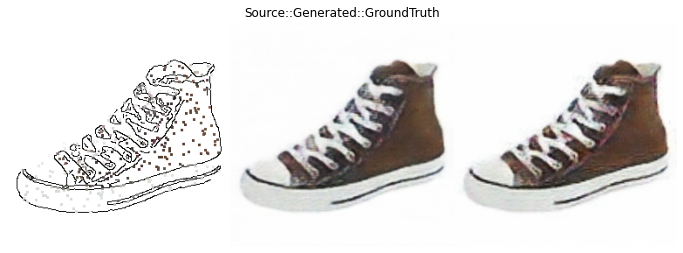

EPOCH: 27.000	errD: 0.482	errG: 3.799	(3663.02s - 9903.71s remaining))


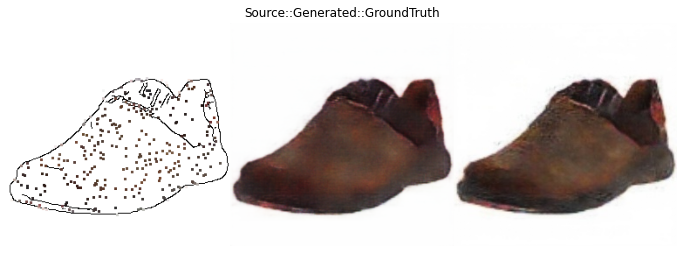

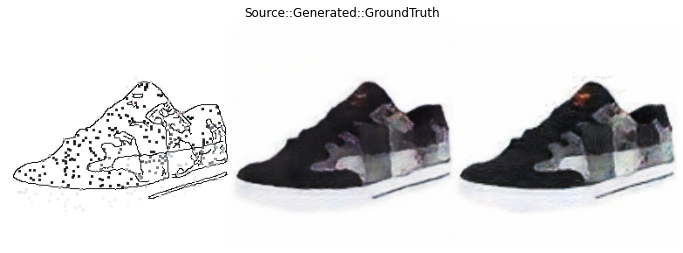

EPOCH: 28.000	errD: 0.498	errG: 3.767	(3799.33s - 9769.71s remaining)


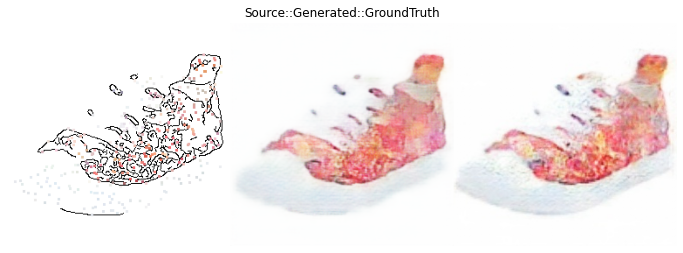

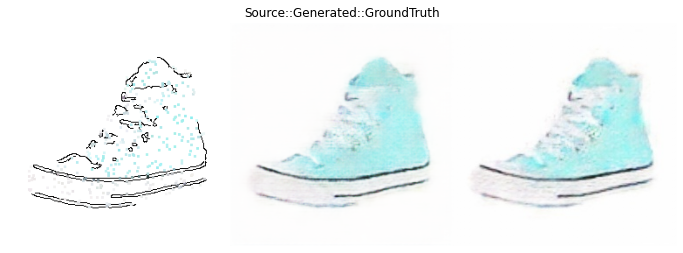

EPOCH: 29.000	errD: 0.496	errG: 3.729	(3935.27s - 9634.63s remaining)


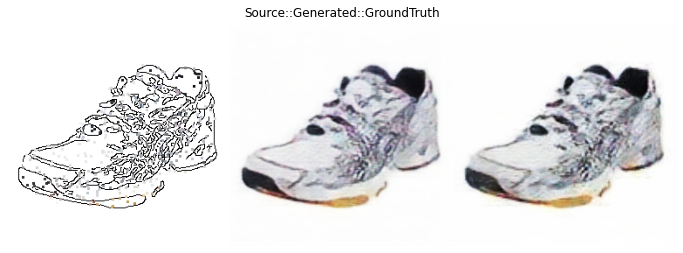

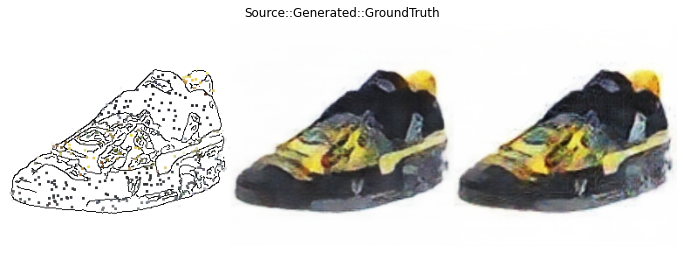

EPOCH: 30.000	errD: 0.486	errG: 3.732	(4071.36s - 9499.85s remaining)


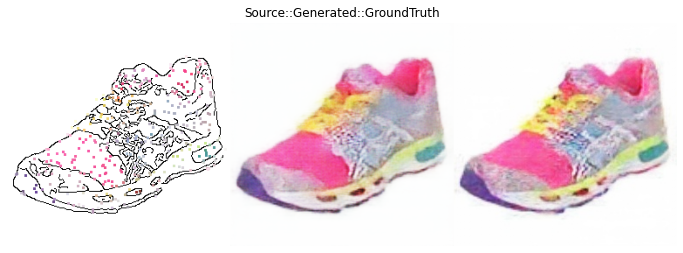

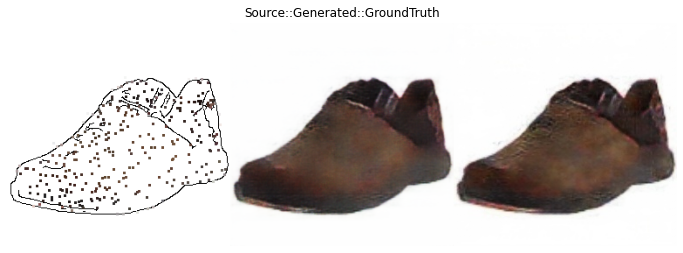

EPOCH: 31.000	errD: 0.500	errG: 3.660	(4207.98s - 9366.14s remaining)


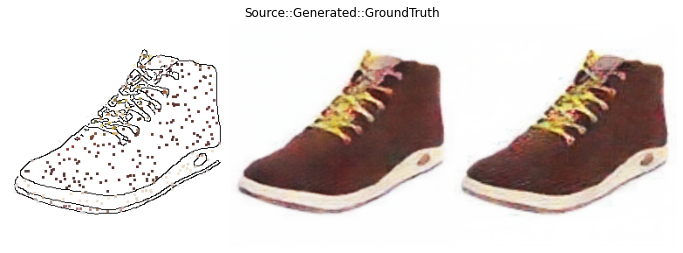

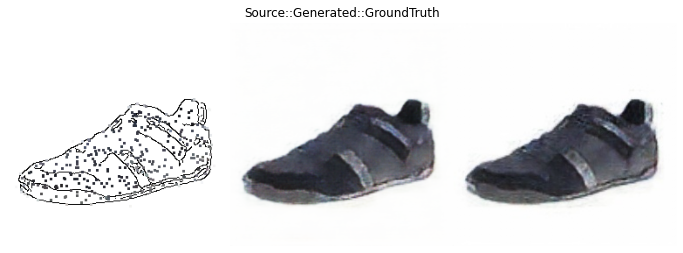

EPOCH: 32.000	errD: 0.479	errG: 3.639	(4343.97s - 9230.93s remaining)


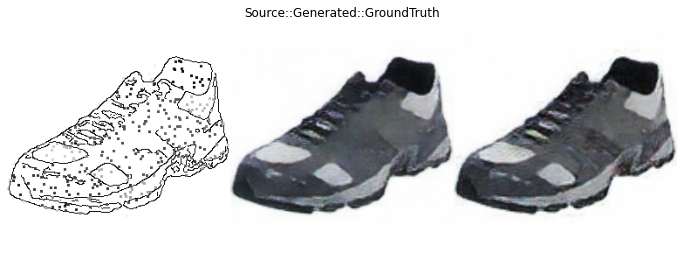

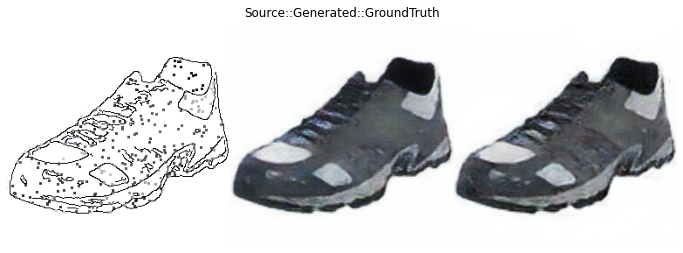

EPOCH: 33.000	errD: 0.621	errG: 3.647	(4479.65s - 9095.05s remaining)


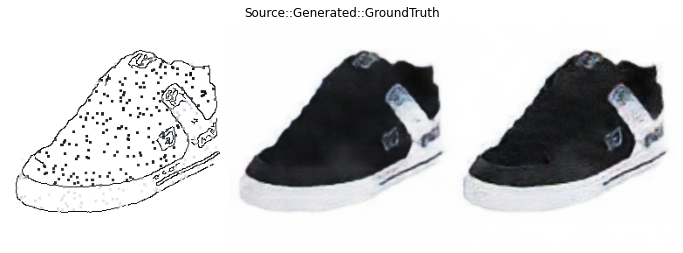

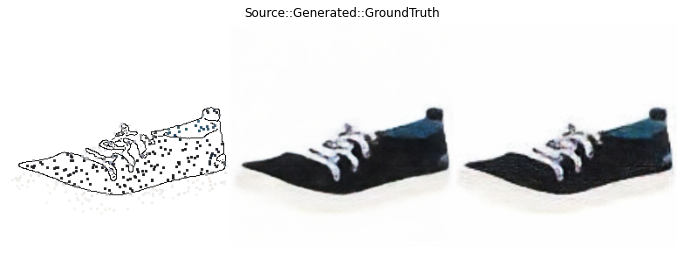

EPOCH: 34.000	errD: 0.473	errG: 3.516	(4615.56s - 8959.62s remaining)


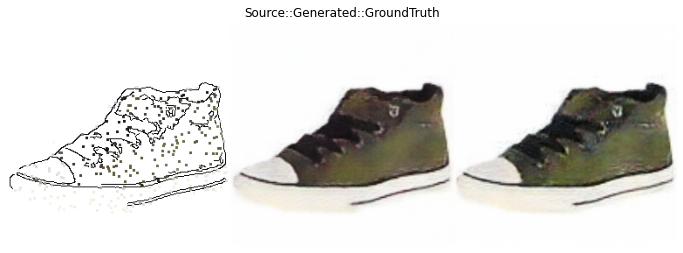

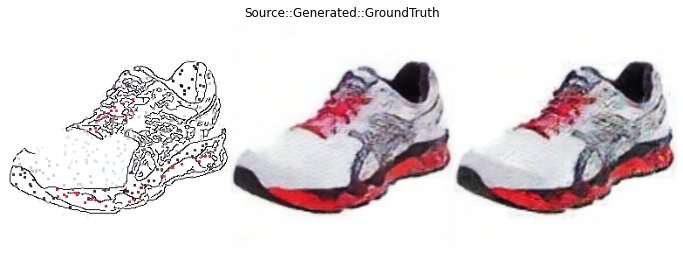

EPOCH: 35.000	errD: 0.468	errG: 3.531	(4751.77s - 8824.72s remaining)


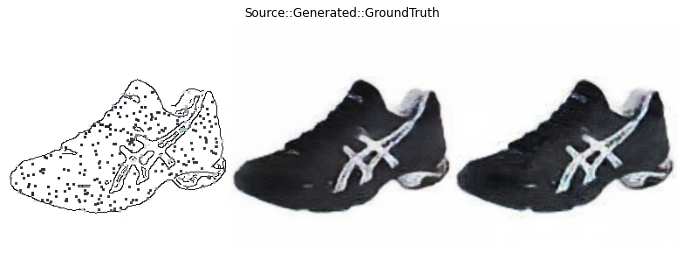

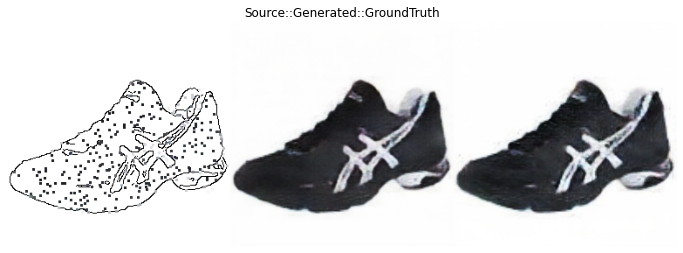

EPOCH: 36.000	errD: 0.488	errG: 3.560	(4887.58s - 8689.03s remaining)


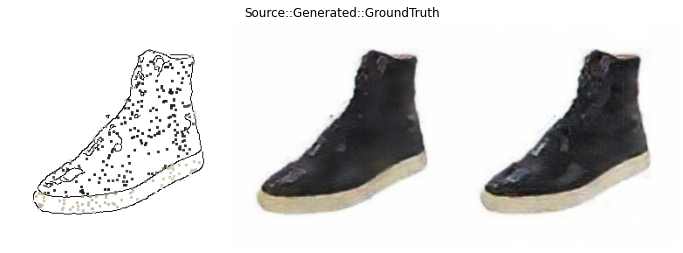

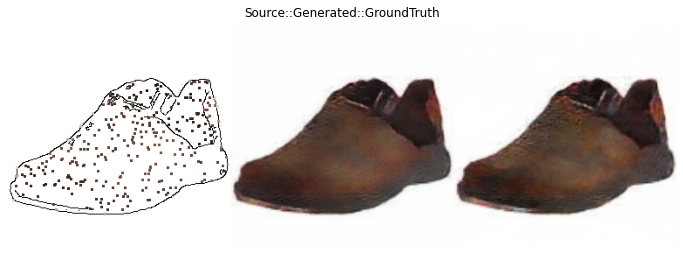

EPOCH: 37.000	errD: 0.480	errG: 3.521	(5023.56s - 8553.62s remaining)


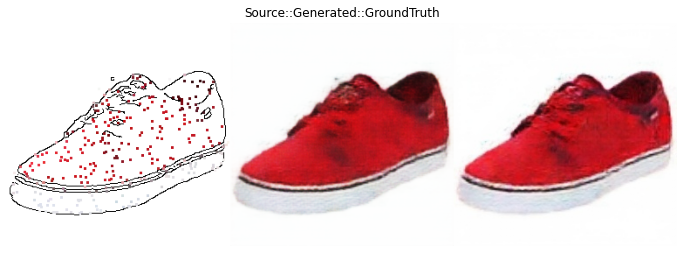

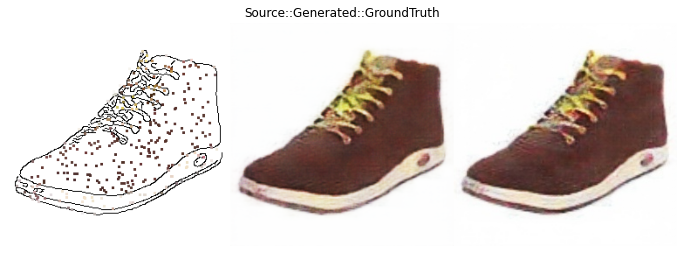

EPOCH: 38.000	errD: 0.491	errG: 3.545	(5160.12s - 8419.14s remaining)


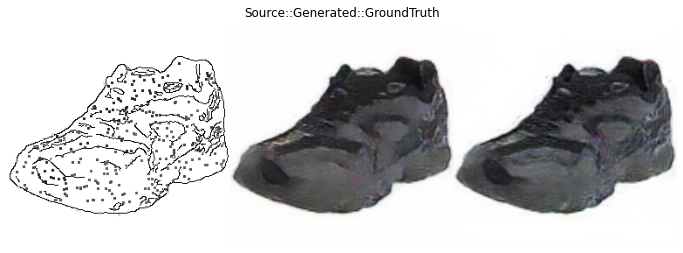

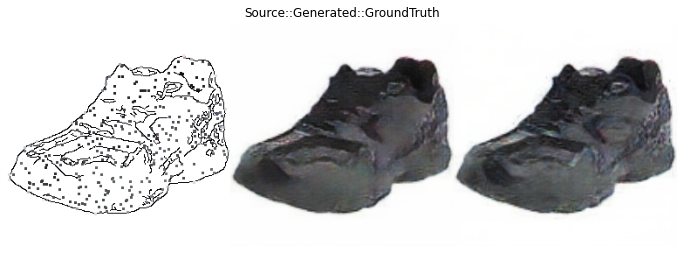

EPOCH: 39.000	errD: 0.477	errG: 3.500	(5295.74s - 8283.08s remaining)


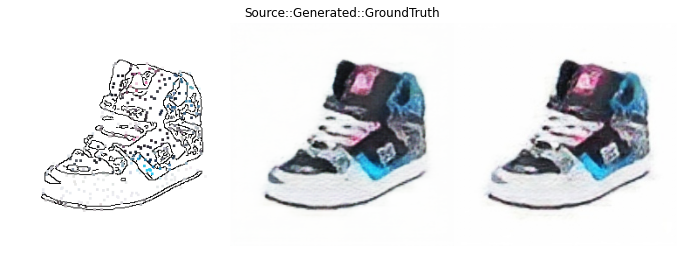

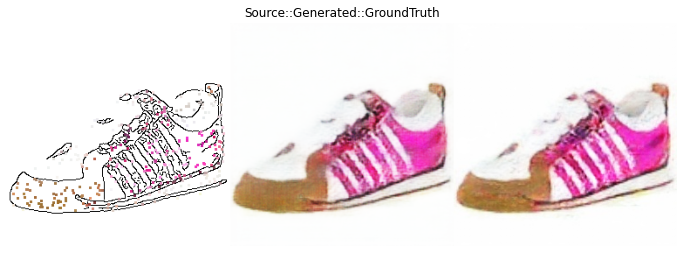

EPOCH: 40.000	errD: 0.485	errG: 3.509	(5431.66s - 8147.49s remaining)


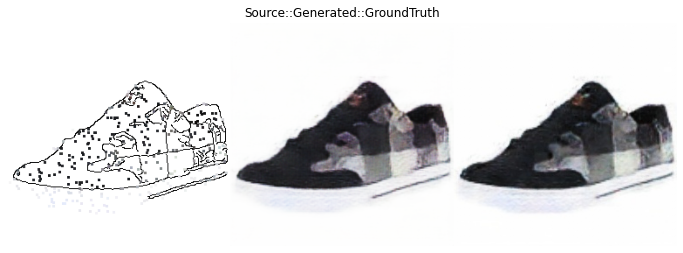

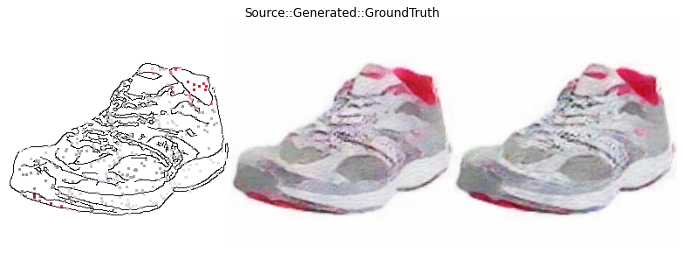

EPOCH: 41.000	errD: 0.481	errG: 3.506	(5568.05s - 8012.56s remaining)


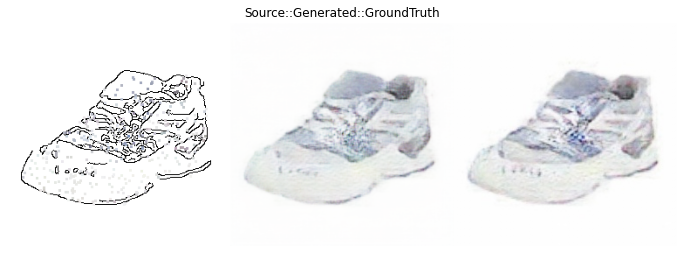

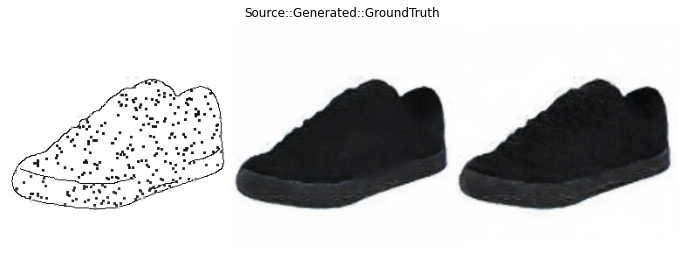

EPOCH: 42.000	errD: 0.574	errG: 3.479	(5704.14s - 7877.15s remaining)


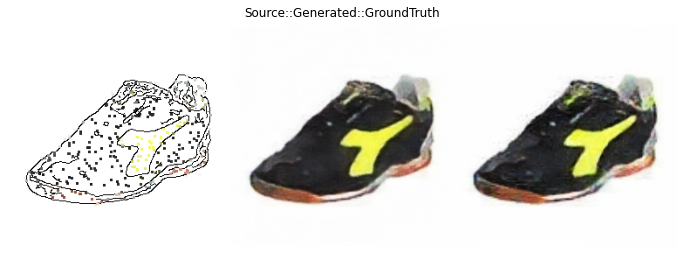

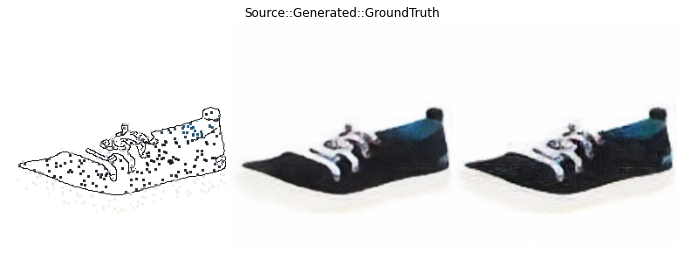

EPOCH: 43.000	errD: 0.496	errG: 3.288	(5839.72s - 7741.02s remaining)


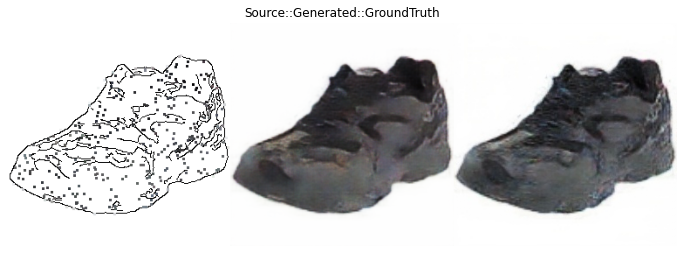

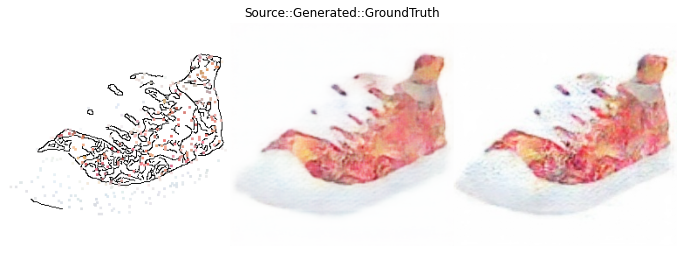

EPOCH: 44.000	errD: 0.481	errG: 3.274	(5975.07s - 7604.63s remaining)


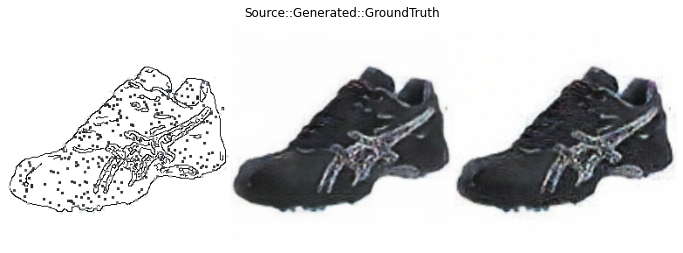

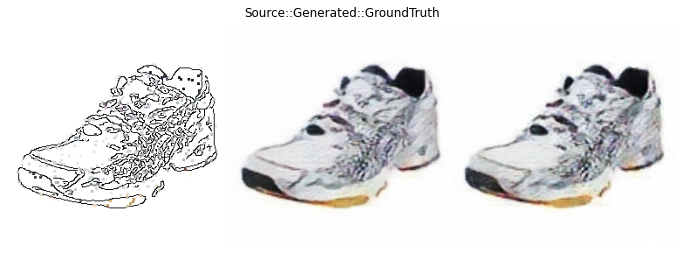

EPOCH: 45.000	errD: 0.492	errG: 3.339	(6111.10s - 7469.12s remaining)


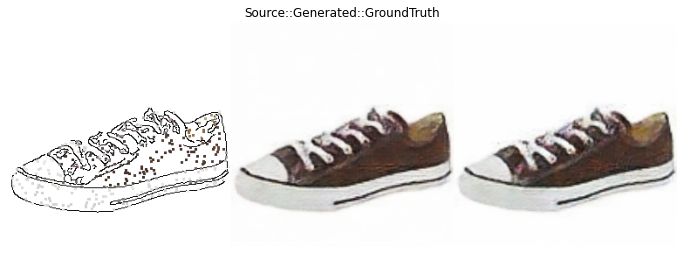

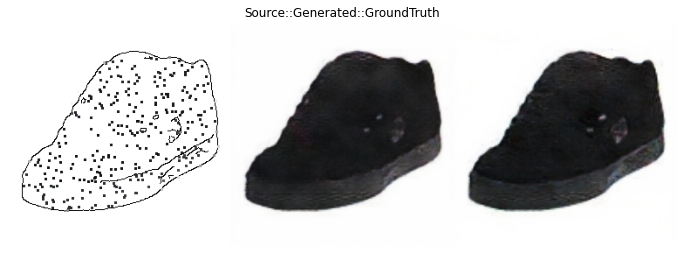

EPOCH: 46.000	errD: 0.479	errG: 3.449	(6247.47s - 7333.99s remaining)


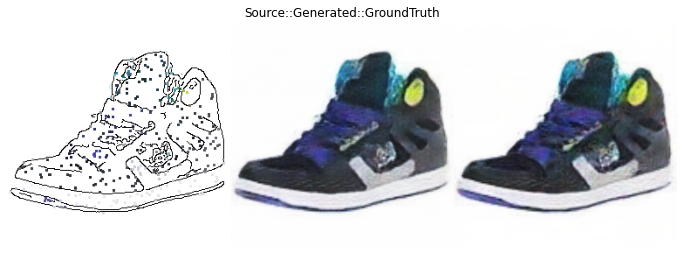

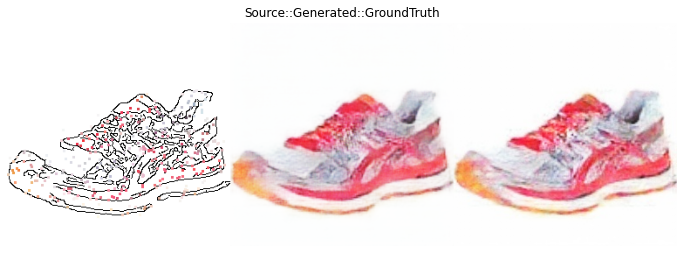

EPOCH: 47.000	errD: 0.470	errG: 3.429	(6383.79s - 7198.74s remaining)


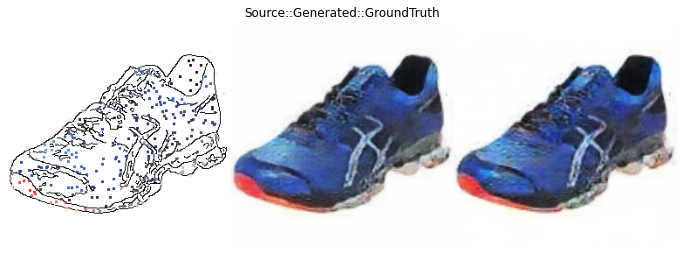

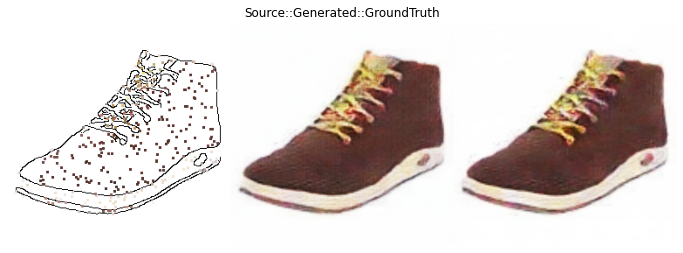

EPOCH: 48.000	errD: 0.466	errG: 3.419	(6519.82s - 7063.14s remaining)


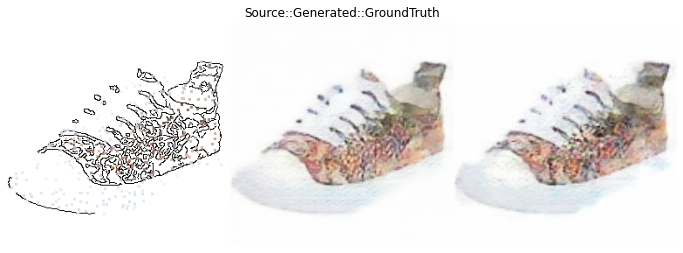

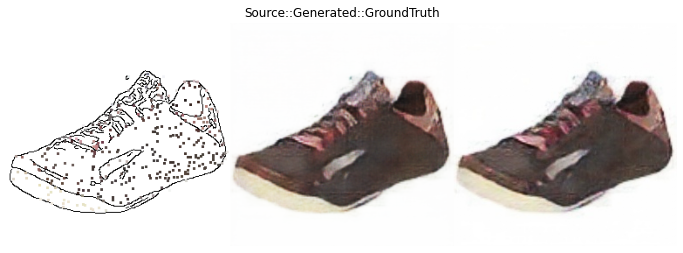

EPOCH: 49.000	errD: 0.449	errG: 3.461	(6655.69s - 6927.35s remaining)


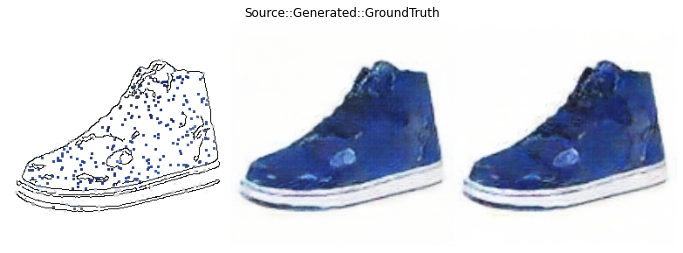

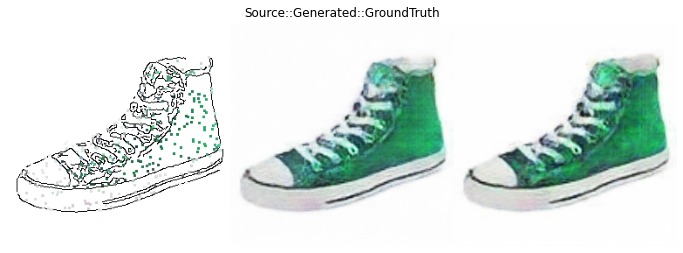

EPOCH: 49.182	errD: 0.802	errG: 3.083	(6680.79s - 6903.07s remaining)

In [ ]:
generator = GeneratorUNet().to(device)
discriminator = Discriminator().to(device)
generator.apply(weights_init_normal)
discriminator.apply(weights_init_normal)

criterion_GAN = torch.nn.MSELoss()
criterion_pixelwise = torch.nn.L1Loss()

lambda_pixel = 100
g_optimizer = torch.optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

val_dl = DataLoader(val_ds, batch_size=1, shuffle=True)

epochs = 100
log = Report(epochs)

for epoch in range(epochs):
    N = len(trn_dl)
    for bx, batch in enumerate(trn_dl):
        real_src, real_trg = batch
        fake_trg = generator(real_src)
        
        errD = discriminator_train_step(real_src, real_trg, fake_trg)
        errG = generator_train_step(real_src, fake_trg)
        log.record(pos=epoch+(1+bx)/N, errD=errD.item(), errG=errG.item(), end='\r')

    log.report_avgs(epoch+1)
    [sample_prediction() for _ in range(2)]
